In [ ]:
!pip install segment-geospatial[samgeo2]  # 安装/升级带文本提示能力的扩展（集成 Grounding/CLIP 等）


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 18.3 MB/s  0:00:00 eta 0:00:01
  Created wheel for sam2: filename=sam2-1.1.0-py3-none-any.whl size=183700 sha256=ca4936c32be266b752393cc07c044459f48b79f28c83efa19455a94ec44009fa
  Stored in directory: /Users/summersmac/Library/Caches/pip/wheels/7f/68/39/098712d2206372bdeb55467019cd1500ef151e465c16d355d6
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31600 sha256=de94f3b4eb717faf233c28bd3d7f6138de7c60220a5aa8e57220db7df56a48e8
  Stored in directory: /Users/summersmac/Library/Caches/pip/wheels/cd/c4/19/776124f304c8d9cb940cb164ec2ad635b42d9d1cf03217506d
Successfully built sam2 iopath
  Attempting uninstall: pyproj
    Found existing installatio

In [4]:
from samgeo import SamGeo  # 导入 samgeo 的高层封装；它内置了 SAM 的自动掩膜与预测器接口
# Getting the Segment Anything model requires completing the setup and installation above first
sam = SamGeo(model_type="vit_b",)  # 初始化 SAM（ViT-B 版本），默认 automatic=True → 使用自动掩膜生成器


There was an error importing sam2. To use SAMGeo 2, install it as:
	pip install segment-geospatial[samgeo2]


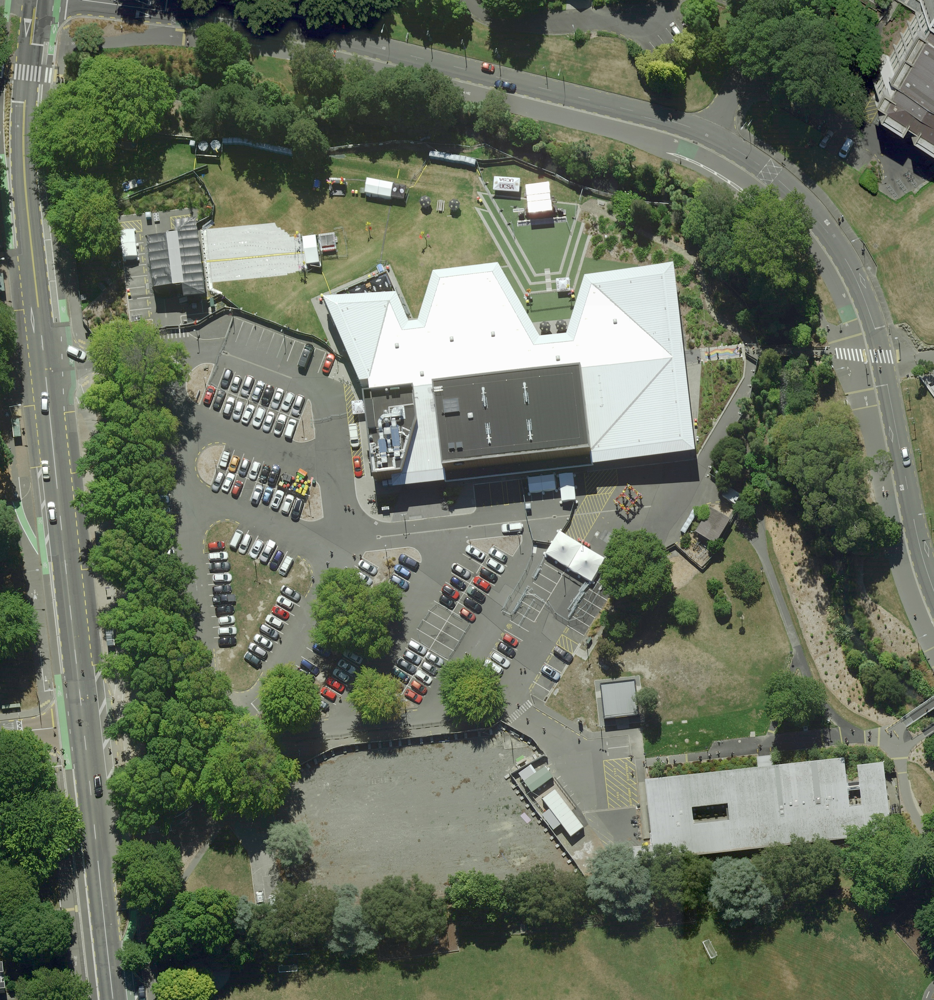

In [2]:
from IPython.display import Image, display  # 笔记本友好显示图片
image = "./Lab8_data/christchurch-0075m-urban-aerial-photos-2023.jpg"
display(Image(filename=image))  # 在输出区展示输入影像，便于肉眼检查

In [6]:
sam.generate(
    source=image,              # 输入图片路径（可为文件或数组）
    output="auto_masks.tif",   # 输出掩膜栅格（GeoTIFF）。若输入无地理参考，则为像素坐标系
    foreground=True            # 仅保留前景掩膜（常能过滤背景大区块）
)
# ↑ automatic=True 时调用 SamAutomaticMaskGenerator：基于图像自动提出一组候选掩膜（object proposals）


In [7]:
sam.tiff_to_vector("auto_masks.tif", "auto_masks.shp")  # 将自动掩膜的 GeoTIFF 转为矢量（一个面 = 一个掩膜）


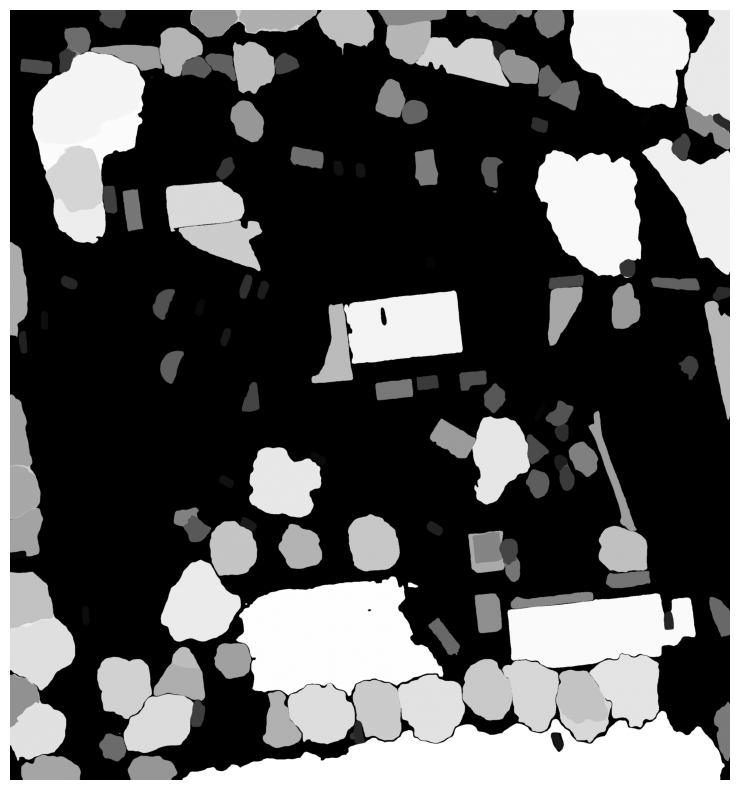

In [8]:
sam.show_masks()                # 以分色叠加的方式显示当前（自动）掩膜集合


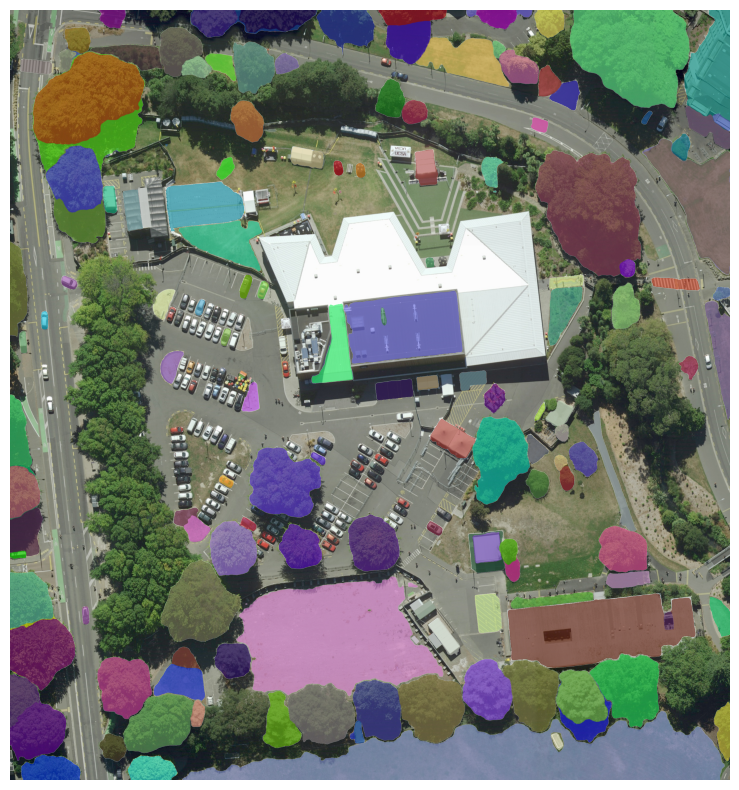

In [9]:
sam.show_anns(alpha=0.6)        # 将所有掩膜以透明度 0.6 的方式叠加到影像上进行可视化


In [ ]:
sam = SamGeo(model_type="vit_b", automatic=False,)  # 重新初始化 SAM，但关闭 automatic → 启用 SamPredictor（交互式提示）
# Set automatic=False to disable the SamAutomaticMaskGenerator and enable the SamPredictor.


In [11]:
point_coords = [[172.579549, -43.524892]]  # 单点提示（经度、纬度）。EPSG:4326 下按 [lon, lat] 顺序
sam.set_image(image)   # 载入要分割的影像；若未设置会报 TypeError（因为 predictor 需要当前图像）
sam.predict(
    point_coords,                 # 提示点列表（可给多点）；坐标系由 point_crs 指定
    point_labels=1,               # 每个点的标签：1=正样本(前景)，0=负样本(背景)
    point_crs="EPSG:4326",        # 提示点坐标的 CRS；内部会重投影到图像像素坐标
    output="pt_mask.tif"          # 将根据提示点得到的单对象掩膜写出为 GeoTIFF
)

sam.tiff_to_vector("pt_mask.tif", "pt_mask.shp")  # 把点提示得到的掩膜转矢量，便于后续 GIS 流程


In [12]:

from samgeo.text_sam import LangSAM       # 文本驱动分割（根据文字提示先找框，再由 SAM 精分割）
import geopandas as gpd

lang_sam = LangSAM('vit_b')  # 初始化文本版 SAM（ViT-B）


GroundingDINO_SwinB.cfg.py: 0.00B [00:00, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

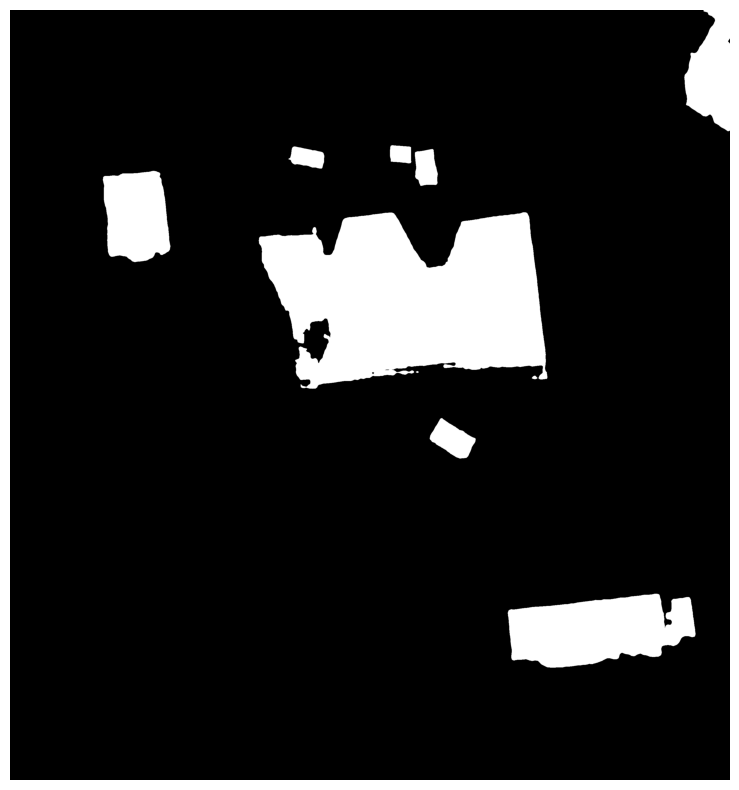

In [15]:

prompt = 'building'  # 文本提示（例如 "building"、"house"、"car"、"tree" 等）

# 用文字提示进行检测+分割：内部通常会先用文本检测器产生候选框，再交给 SAM 生成像素级掩膜
lang_sam.predict(
    image,                # 输入影像路径
    prompt,               # 文本提示
    box_threshold=0.24,   # 检测框阈值（放宽可召回更多小目标/低置信候选）
    text_threshold=0.24   # 文本匹配阈值（调节短语与类别匹配的灵敏度）
)

# 设定输出路径（与提示词同名，便于管理多类别结果）
raster_output = f"{prompt}_mask.tif"
vector_output = f"{prompt}_mask.shp"

# 将当前预测的掩膜可视化并导出为栅格：cmap 灰度、alpha=1 表示纯掩膜，blend=False 不与底图混合
lang_sam.show_anns(
    cmap='Greys_r',
    add_boxes=False,   # 不叠加候选框，仅输出掩膜
    alpha=1,
    blend=False,
    output=raster_output,  # 同时把当前掩膜写成 GeoTIFF（若原图无地理参考，则为像素坐标）
)

lang_sam.raster_to_vector(raster_output, vector_output)  # 将掩膜栅格矢量化生成面要素


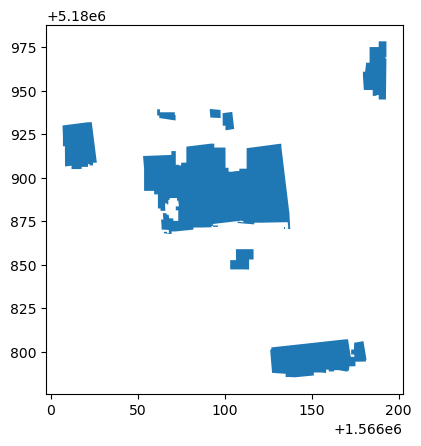

In [16]:

import geopandas as gpd
from geoai import geoai  # geoai 提供建筑物规整化（边对齐、直角化等）工具

gdf = gpd.read_file(vector_output)  # 读取由文本提示生成的建筑面

gdf_regularized = geoai.regularization(
    building_polygons=gdf,  # 待规整的建筑多边形
    angle_tolerance=10,     # 角度容差（°）：靠近 0/90/180 的角会被拉正，容差越大规整越强
    simplify_tolerance=0.5, # 简化容差（图层单位）：去除锯齿、短小折线，单位取决于数据 CRS
    orthogonalize=True,     # 对边进行正交化（更像“直角建筑”）
    preserve_topology=True, # 保拓扑：避免自交、裂缝等几何问题
)

gdf_regularized.plot()                 # 快速预览规整后的建筑成果
gdf_regularized.to_file("buildings_regularised.shp")  # 写出规整化后的建筑矢量


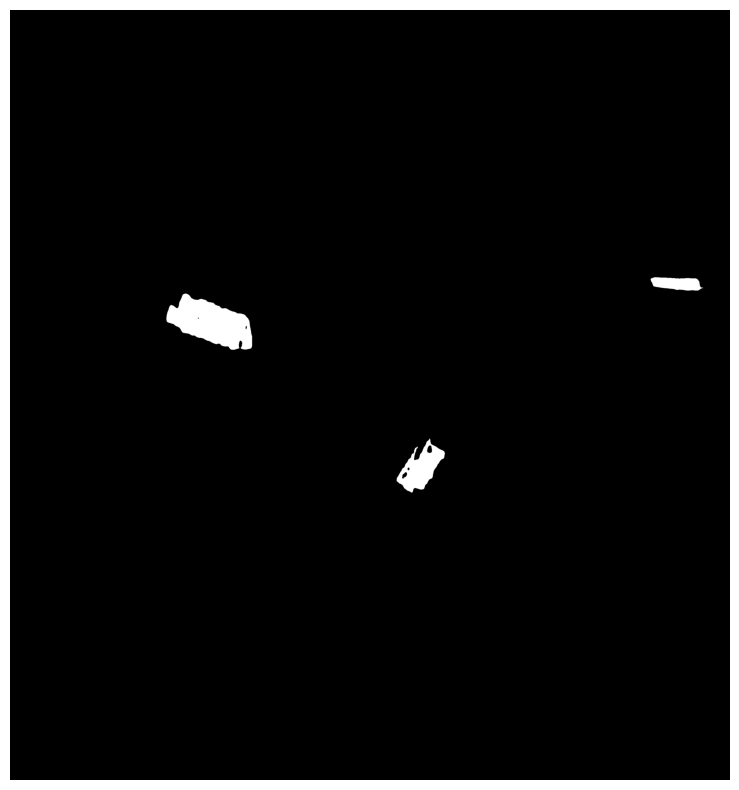

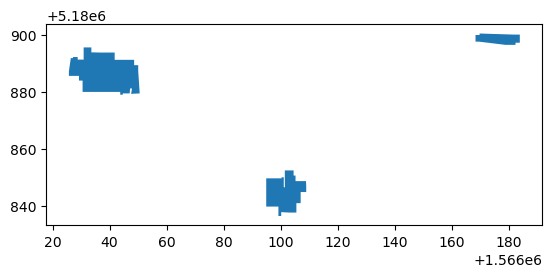

In [22]:

prompt = 'zebra crossing'  # 文本提示（例如 "building"、"house"、"car"、"tree" 等）

# 用文字提示进行检测+分割：内部通常会先用文本检测器产生候选框，再交给 SAM 生成像素级掩膜
lang_sam.predict(
    image,                # 输入影像路径
    prompt,               # 文本提示
    box_threshold=0.2,   # 检测框阈值（放宽可召回更多小目标/低置信候选）
    text_threshold=0.24   # 文本匹配阈值（调节短语与类别匹配的灵敏度）
)

# 设定输出路径（与提示词同名，便于管理多类别结果）
raster_output = f"{prompt}_mask.tif"
vector_output = f"{prompt}_mask.shp"

# 将当前预测的掩膜可视化并导出为栅格：cmap 灰度、alpha=1 表示纯掩膜，blend=False 不与底图混合
lang_sam.show_anns(
    cmap='Greys_r',
    add_boxes=False,   # 不叠加候选框，仅输出掩膜
    alpha=1,
    blend=False,
    output=raster_output,  # 同时把当前掩膜写成 GeoTIFF（若原图无地理参考，则为像素坐标）
)

lang_sam.raster_to_vector(raster_output, vector_output)  # 将掩膜栅格矢量化生成面要素

import geopandas as gpd
from geoai import geoai  # geoai 提供建筑物规整化（边对齐、直角化等）工具
gdf = gpd.read_file(vector_output)  # 读取由文本提示生成的建筑面

gdf_regularized = geoai.regularization(
    building_polygons=gdf,  # 待规整的建筑多边形
    angle_tolerance=10,     # 角度容差（°）：靠近 0/90/180 的角会被拉正，容差越大规整越强
    simplify_tolerance=0.5, # 简化容差（图层单位）：去除锯齿、短小折线，单位取决于数据 CRS
    orthogonalize=True,     # 对边进行正交化（更像“直角建筑”）
    preserve_topology=True, # 保拓扑：避免自交、裂缝等几何问题
)

gdf_regularized.plot()                 # 快速预览规整后的建筑成果
gdf_regularized.to_file("zebra_crossing_regularised.shp")  # 写出规整化后的建筑矢量


1) By replacing the prompt 'building' with 'zebra crossing' and setting the lang_sam.predict parameter 'box_threshold' to 0.2 (lowering this value can help retrieve more small objects or candidates with low confidence), a zebra_crossing_mask.tif image was generated as attached. There were three zebra crossings in this image, and they were satisfactory according to the original aerial photo verification.

# other picture to employ the SAM model

In [1]:
%pip install pillow-heif pillow

from PIL import Image
import pillow_heif

heif_file = pillow_heif.read_heif("./Lab8_data/IMG_7840.HEIC")
image = Image.frombytes(
    heif_file.mode,
    heif_file.size,
    heif_file.data,
)
image.save("lyttelton.png")

Note: you may need to restart the kernel to use updated packages.


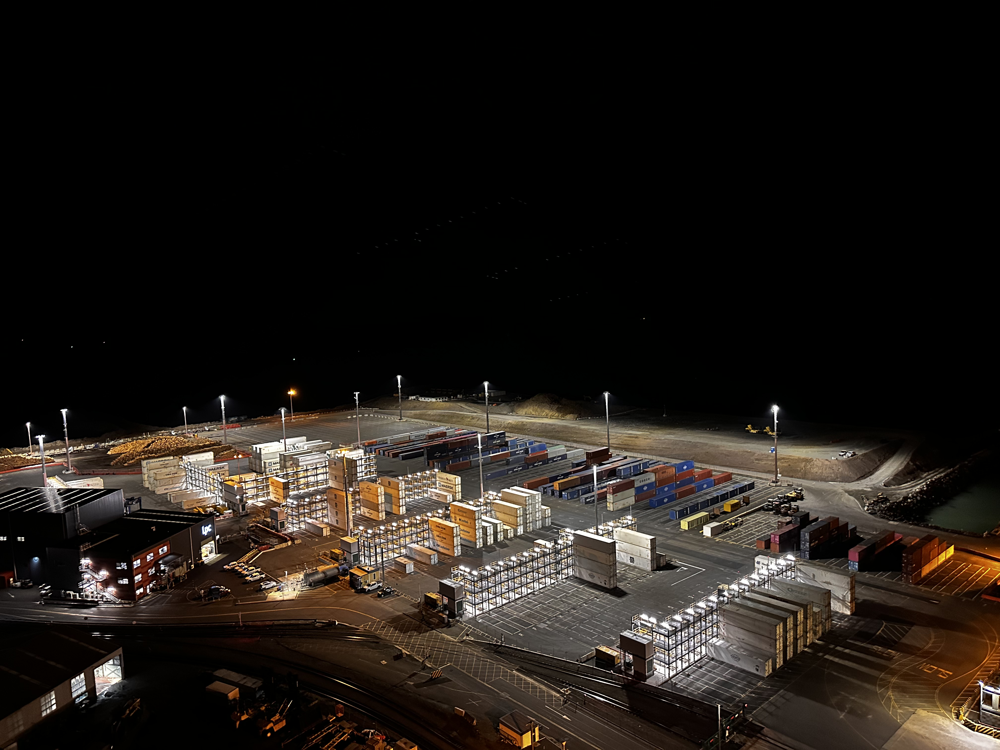

In [6]:
from IPython.display import Image, display  # 笔记本友好显示图片
image = "./lyttelton.png"
display(Image(filename=image))  # 在输出区展示输入影像，便于肉眼检查

final text_encoder_type: bert-base-uncased


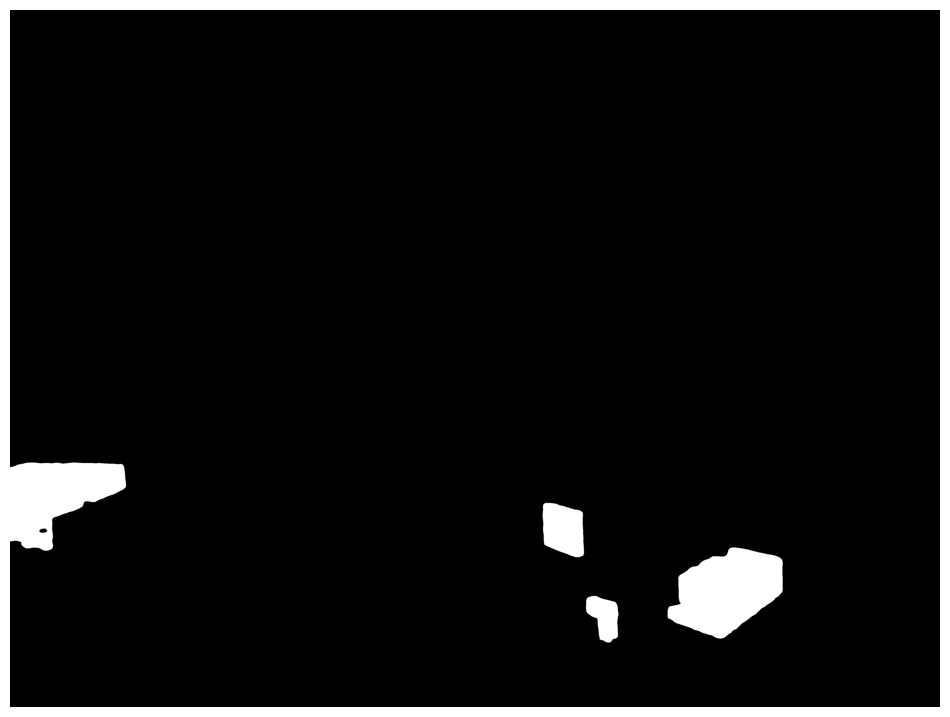

In [30]:
from samgeo.text_sam import LangSAM       # 文本驱动分割（根据文字提示先找框，再由 SAM 精分割）
import geopandas as gpd

lang_sam = LangSAM('vit_b')  # 初始化文本版 SAM（ViT-B）
prompt = 'ISO container'  # 文本提示（例如 "building"、"house"、"car"、"tree" 等）

# 用文字提示进行检测+分割：内部通常会先用文本检测器产生候选框，再交给 SAM 生成像素级掩膜
lang_sam.predict(
    image,                # 输入影像路径
    prompt,               # 文本提示
    box_threshold=0.2,   # 检测框阈值（放宽可召回更多小目标/低置信候选）
    text_threshold=0.3   # 文本匹配阈值（调节短语与类别匹配的灵敏度）
)

# 设定输出路径（与提示词同名，便于管理多类别结果）
raster_output = f"{prompt}_mask.tif"
vector_output = f"{prompt}_mask.shp"


# 将当前预测的掩膜可视化并导出为栅格：cmap 灰度、alpha=1 表示纯掩膜，blend=False 不与底图混合
lang_sam.show_anns(
    cmap='Greys_r',
    add_boxes=False,   # 不叠加候选框，仅输出掩膜
    alpha=1,
    blend=False,
    output=raster_output,  # 同时把当前掩膜写成 GeoTIFF（若原图无地理参考，则为像素坐标）
)

lang_sam.raster_to_vector(raster_output, vector_output)  # 将掩膜栅格矢量化生成面要素


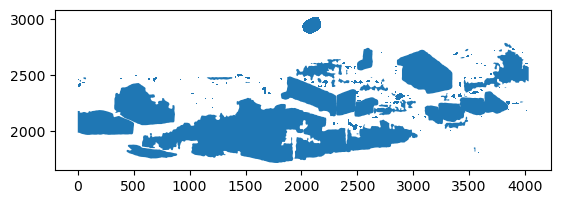

In [14]:

import geopandas as gpd
from geoai import geoai  # geoai 提供建筑物规整化（边对齐、直角化等）工具
gdf = gpd.read_file(vector_output)  # 读取由文本提示生成的建筑面

gdf_regularized = geoai.regularization(
    building_polygons=gdf,  # 待规整的建筑多边形
    angle_tolerance=10,     # 角度容差（°）：靠近 0/90/180 的角会被拉正，容差越大规整越强
    simplify_tolerance=0.5, # 简化容差（图层单位）：去除锯齿、短小折线，单位取决于数据 CRS
    orthogonalize=True,     # 对边进行正交化（更像“直角建筑”）
    preserve_topology=True, # 保拓扑：避免自交、裂缝等几何问题
)

gdf_regularized.plot()                 # 快速预览规整后的建筑成果
gdf_regularized.to_file("cargo.shp")  # 写出规整化后的建筑矢量


final text_encoder_type: bert-base-uncased
No objects found in the image.


ValueError: You must provide at least a geometry column or a field

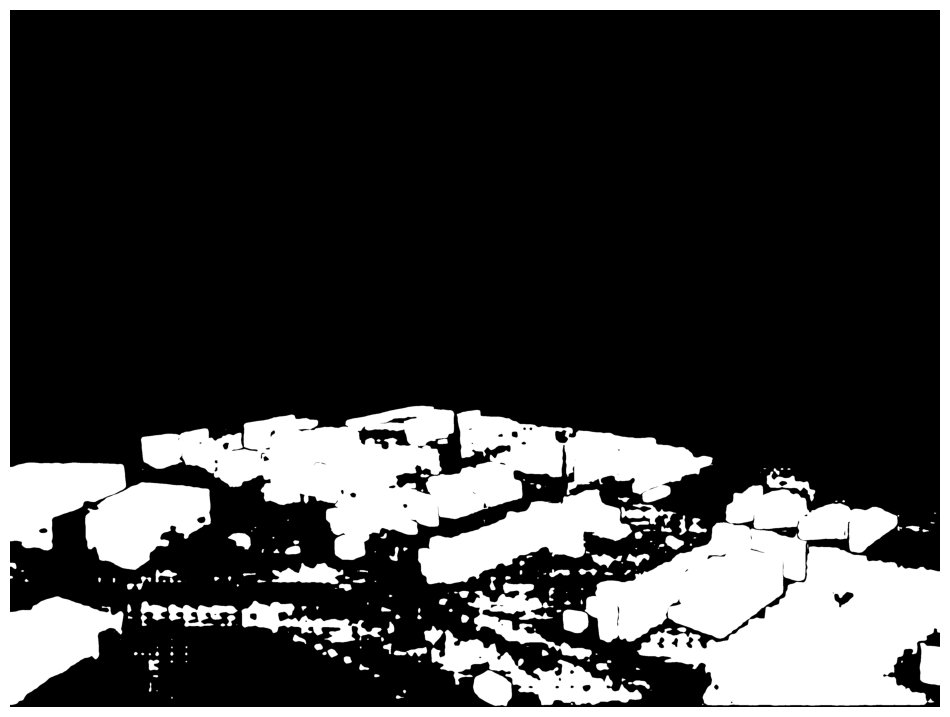

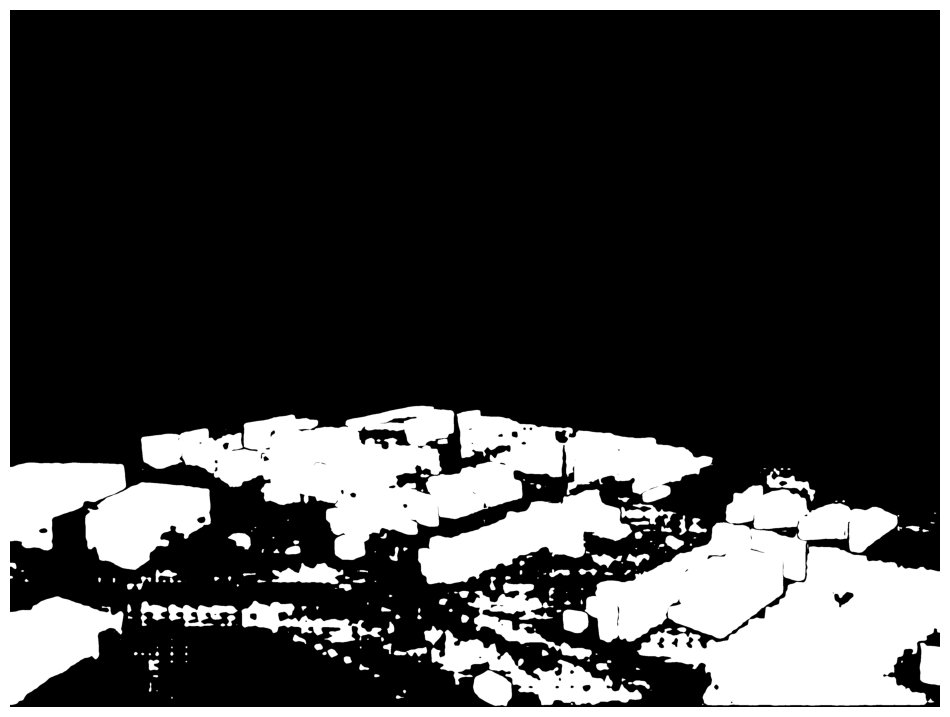

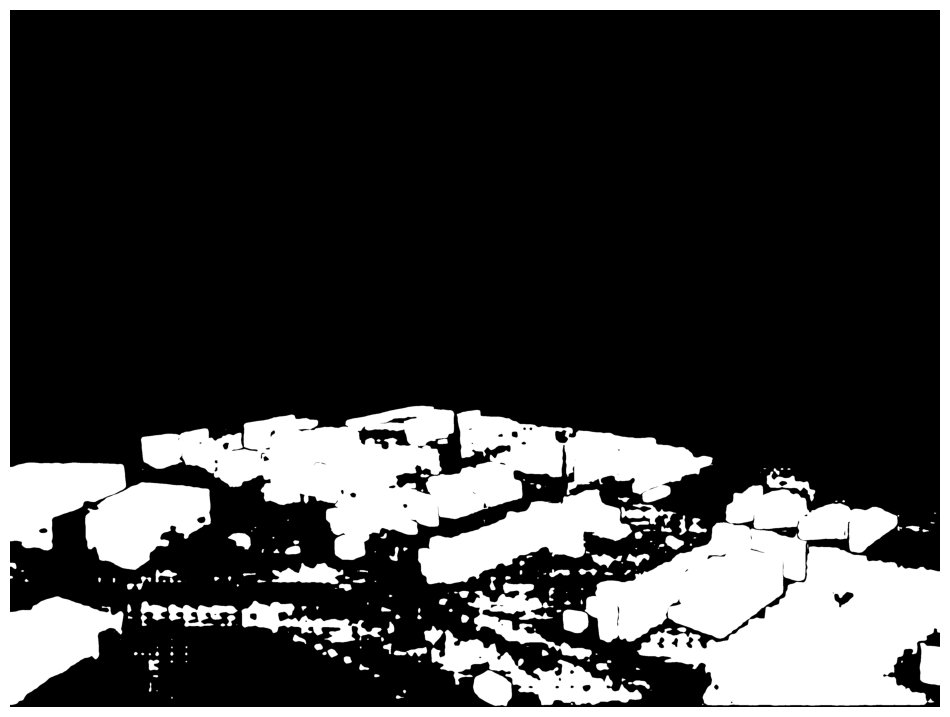

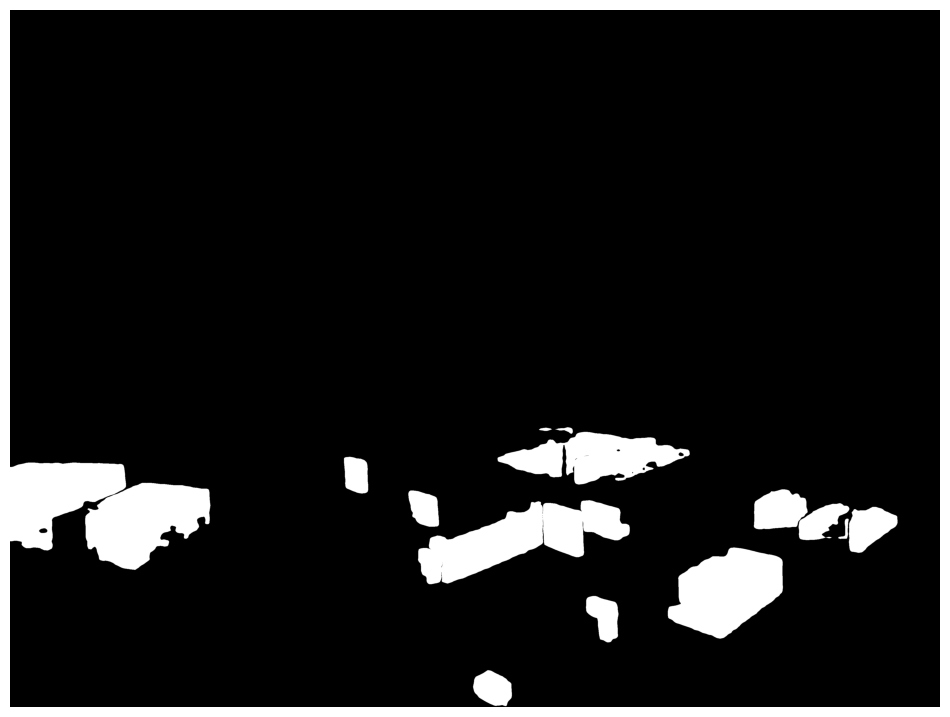

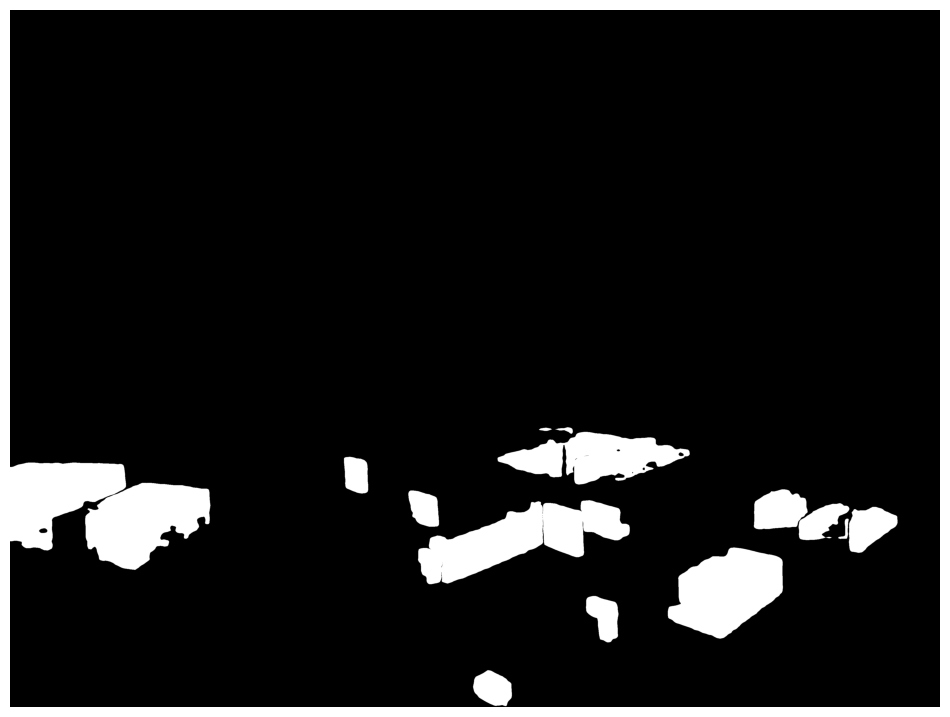

...

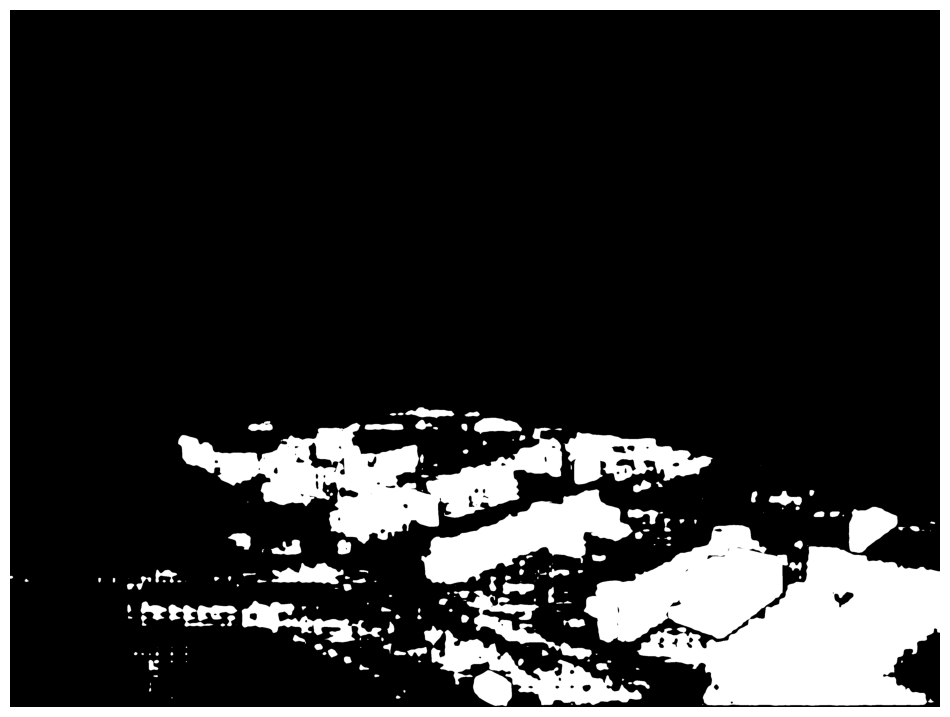

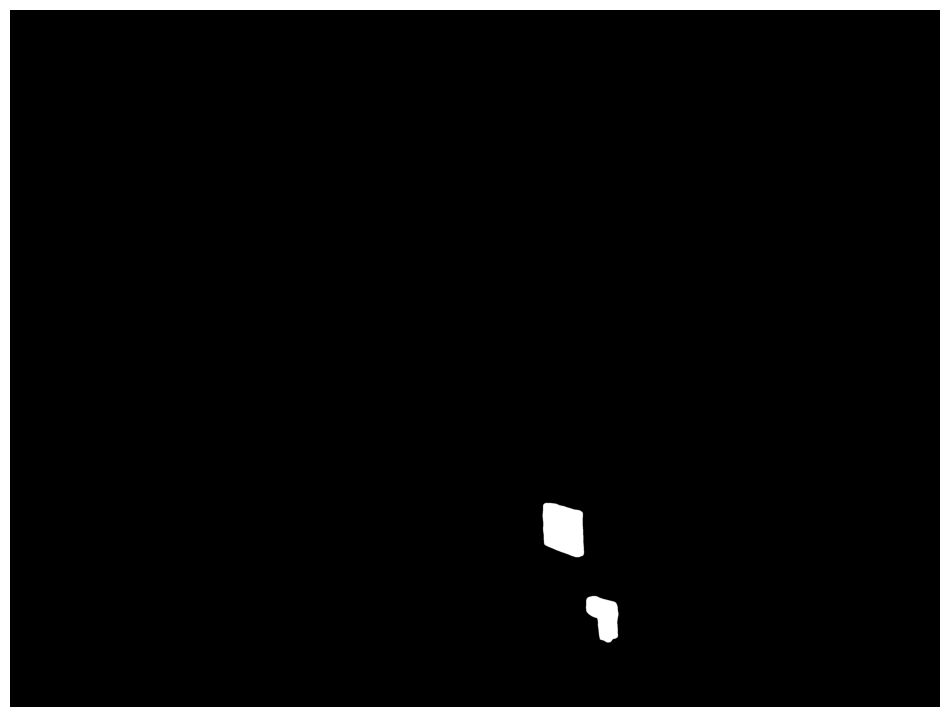

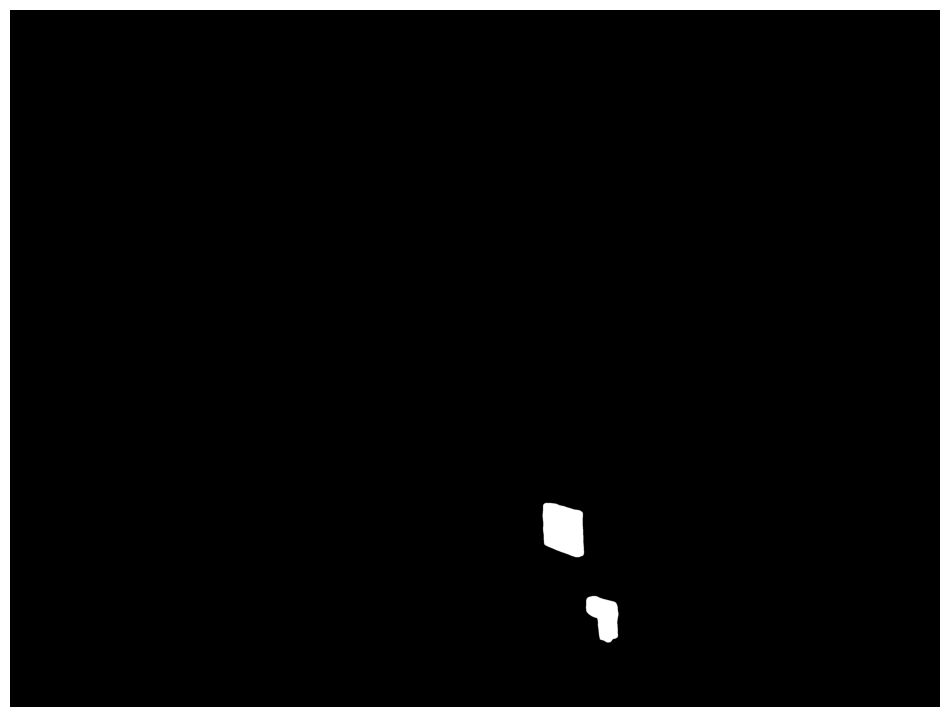

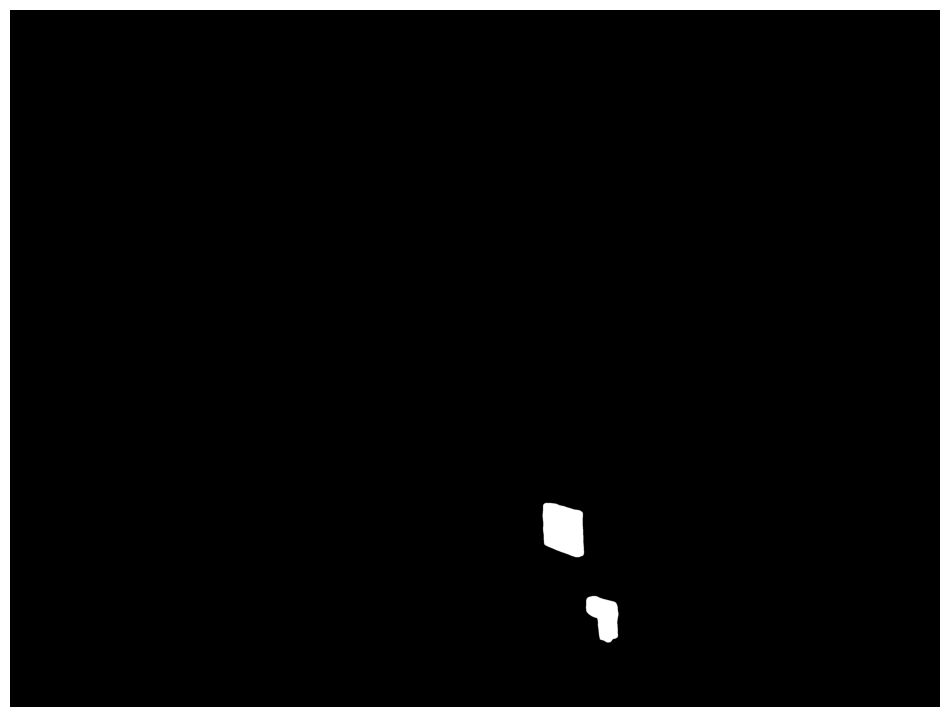

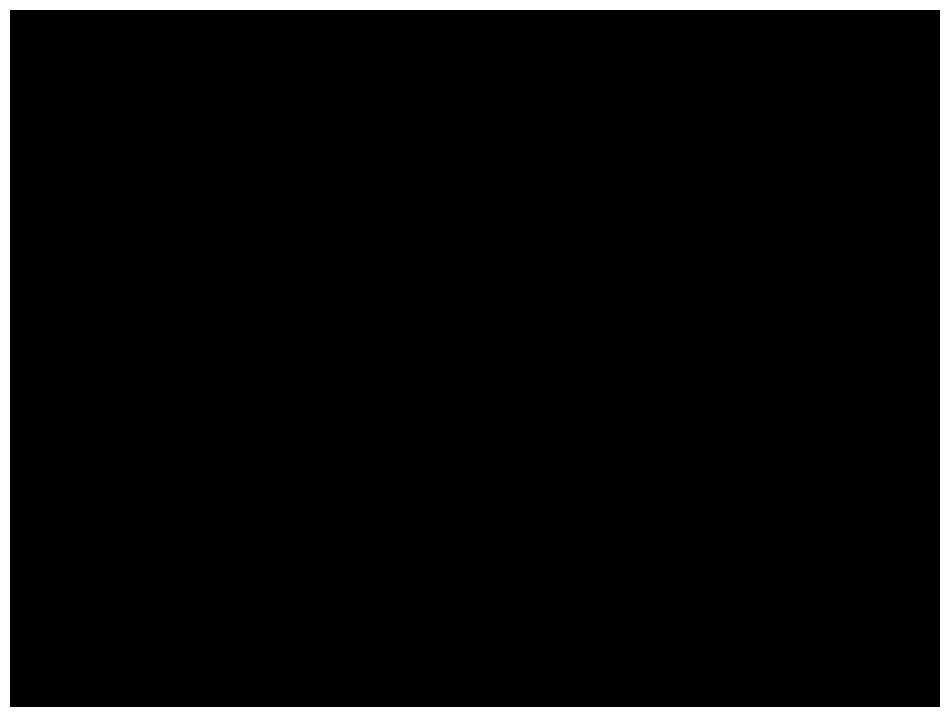

In [32]:
from samgeo.text_sam import LangSAM
import geopandas as gpd
import numpy as np
from shapely.affinity import rotate
from shapely.geometry import box
from shapely.ops import unary_union
import os

# ---------- 1) 初始化 ----------
lang_sam = LangSAM('vit_b')

# Ensure output directory exists
os.makedirs("./lyttelton", exist_ok=True)

image_path = image  # 你现有的变量

# 更贴切“集装箱”的多提示词（可按需增删）
prompts = [
    "shipping container",
    "intermodal container",
    "freight container",
    "ISO container",
    "container stack",
    "container yard"
]

# 阈值组合（小目标：低box_threshold + 稍高text_threshold）
box_grid  = [0.15, 0.20, 0.25]
text_grid = [0.30, 0.35, 0.40]

# ---------- 2) 简易分块（可按图像大小调整） ----------
def gen_tiles(W, H, tile=1024, overlap=128):
    xs = list(range(0, max(W - tile, 0) + 1, tile - overlap))
    ys = list(range(0, max(H - tile, 0) + 1, tile - overlap))
    for x in xs:
        for y in ys:
            yield (x, y, min(x + tile, W), min(y + tile, H))

# 如果 LangSAM 暂不支持内部 tiling，我们用外部框裁剪（演示用，真实需读图尺寸）
# 你也可以跳过 tiling，先用整图试；若召回不足，再加 tiling。
use_tiling = False  # 先 False，必要再开

# ---------- 3) 运行：多提示词 × 阈值网格（× 可选分块 / 多尺度） ----------
all_vectors = []

for p in prompts:
    for bth in box_grid:
        for tth in text_grid:
            # 可视化调参时把 add_boxes=True 看框的覆盖率
            lang_sam.predict(
                image_path,
                p,
                box_threshold=bth,
                text_threshold=tth
            )
            # 导出当前组合的掩膜（不混底图，便于后处理）
            raster_output = f"./lyttelton/tmp_{p.replace(' ','_')}_b{bth}_t{tth}.tif"
            lang_sam.show_anns(
                cmap='Greys_r',
                add_boxes=False,
                alpha=1,
                blend=False,
                output=raster_output
            )
            vec_path = raster_output.replace(".tif", ".shp")
            lang_sam.raster_to_vector(raster_output, vec_path)
            gdf = gpd.read_file(vec_path)
            if len(gdf):
                gdf["prompt"] = p
                gdf["box_th"] = bth
                gdf["text_th"] = tth
                all_vectors.append(gdf)

if not all_vectors:
    print("No detections. Try lowering box_threshold or adding more prompts.")
    raise SystemExit

raw_gdf = gpd.pd.concat(all_vectors, ignore_index=True)


3) Evaluation of the Segment Anything Model (SAM)

In this experiment, I applied LangSAM (ViT-B backbone) with text prompts to identify shipping containers in oblique aerial imagery of the port. A grid search over detection thresholds (box_threshold = 0.15–0.25, text_threshold = 0.30–0.40) produced multiple candidate segmentations. After manual inspection, the most satisfactory result was obtained with prompt = “intermodal container,” box_threshold = 0.20, text_threshold = 0.30.

Strengths:
	•	Zero-shot generalization: SAM successfully detected container-like objects without any domain-specific training data, confirming its ability to transfer knowledge across object categories.
	•	Prompt flexibility: Varying textual prompts (“shipping container,” “ISO container,” etc.) improved recall, showing that prompt engineering can guide the model towards more accurate object proposals.
	•	Scalability: The model can generate multiple candidate masks, which allows manual or rule-based post-selection for practical workflows in GIS.

Weaknesses:
	•	Sensitivity to thresholds: Results varied significantly across the box/text threshold grid, requiring empirical search and human validation. This demonstrates limited robustness in parameter settings.
	•	Small or fine objects: Containers in dense or oblique views were sometimes missed or fragmented, consistent with SAM’s known difficulty in segmenting very small or thin structures.
	•	Domain limitations: While general object segmentation was feasible, SAM was not trained specifically for oblique aerial port scenes; contextual confusion (e.g., between containers and buildings or vehicles) occasionally reduced precision.
	•	Manual refinement: Achieving usable output still required manual inspection and post-selection, highlighting that SAM is not yet a turnkey solution for specialized GIS tasks.

Overall assessment:
SAM performs well for broad, object-level segmentation where approximate masks are sufficient and where zero-shot adaptability is valuable (e.g., exploratory GIS, rapid response). It performs poorly in cases demanding high precision on small, domain-specific targets or where consistent results across parameter ranges are necessary. These limitations arise because SAM’s training emphasizes generalization over fine-tuned accuracy, leading to challenges in oblique, cluttered, or small-object imagery.

